In [1]:
import pandas as pd
covid_data = pd.read_csv('data/covid_data.csv')
display(covid_data)

,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0
3,01/22/2020,Fujian,China,1.0,0.0,0.0
4,01/22/2020,Gansu,China,0.0,0.0,0.0
...,...,...,...,...,...,...
306424,05/29/2021,Zaporizhia Oblast,Ukraine,102641.0,2335.0,95289.0
306425,05/29/2021,Zeeland,Netherlands,29147.0,245.0,0.0
306426,05/29/2021,Zhejiang,China,1364.0,1.0,1324.0
306427,05/29/2021,Zhytomyr Oblast,Ukraine,87550.0,1738.0,83790.0


In [2]:
vaccinations_data = pd.read_csv('data/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]
display(vaccinations_data)

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.00,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
3,Afghanistan,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
4,Afghanistan,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
...,...,...,...,...,...,...,...,...,...
42790,Zimbabwe,2021-09-01,4270430.0,2615233.0,17.33,1655197.0,10.97,36416.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac..."
42791,Zimbabwe,2021-09-02,4323735.0,2649505.0,17.56,1674230.0,11.09,39711.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac..."
42792,Zimbabwe,2021-09-03,4372216.0,2681657.0,17.77,1690559.0,11.20,42317.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac..."
42793,Zimbabwe,2021-09-04,4400246.0,2698332.0,17.88,1701914.0,11.28,41413.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac..."


In [3]:
covid_data = covid_data.groupby(
    ['date', 'country'], 
    as_index=False
)[['confirmed', 'deaths', 'recovered']].sum()
display(covid_data)

,date,country,confirmed,deaths,recovered
0,01/01/2021,Afghanistan,51526.0,2191.0,41727.0
1,01/01/2021,Albania,58316.0,1181.0,33634.0
2,01/01/2021,Algeria,99897.0,2762.0,67395.0
3,01/01/2021,Andorra,8117.0,84.0,7463.0
4,01/01/2021,Angola,17568.0,405.0,11146.0
...,...,...,...,...,...
86780,12/31/2020,Vietnam,1465.0,35.0,1325.0
86781,12/31/2020,West Bank and Gaza,138004.0,1400.0,117183.0
86782,12/31/2020,Yemen,2099.0,610.0,1394.0
86783,12/31/2020,Zambia,20725.0,388.0,18660.0


In [4]:
covid_data['date'] = pd.to_datetime(covid_data['date'])
display(covid_data)

,date,country,confirmed,deaths,recovered
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0
3,2021-01-01,Andorra,8117.0,84.0,7463.0
4,2021-01-01,Angola,17568.0,405.0,11146.0
...,...,...,...,...,...
86780,2020-12-31,Vietnam,1465.0,35.0,1325.0
86781,2020-12-31,West Bank and Gaza,138004.0,1400.0,117183.0
86782,2020-12-31,Yemen,2099.0,610.0,1394.0
86783,2020-12-31,Zambia,20725.0,388.0,18660.0


In [5]:
covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']
display(covid_data)

,date,country,confirmed,deaths,recovered,active
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0,7608.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0,23501.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0,29740.0
3,2021-01-01,Andorra,8117.0,84.0,7463.0,570.0
4,2021-01-01,Angola,17568.0,405.0,11146.0,6017.0
...,...,...,...,...,...,...
86780,2020-12-31,Vietnam,1465.0,35.0,1325.0,105.0
86781,2020-12-31,West Bank and Gaza,138004.0,1400.0,117183.0,19421.0
86782,2020-12-31,Yemen,2099.0,610.0,1394.0,95.0
86783,2020-12-31,Zambia,20725.0,388.0,18660.0,1677.0


In [6]:
covid_data = covid_data.sort_values(by=['country', 'date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()
display(covid_data)

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered
11337,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN
11570,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
11807,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12051,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12299,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
15933,2020-03-12,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16595,2020-03-14,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16938,2020-03-15,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17290,2020-03-16,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])
vaccinations_data = vaccinations_data.sort_values(by=['date'])
display(vaccinations_data)

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
28893,Norway,2020-12-02,0.0,0.0,0.00,NaN,NaN,NaN,"Moderna, Pfizer/BioNTech"
28894,Norway,2020-12-03,0.0,0.0,0.00,NaN,NaN,0.0,"Moderna, Pfizer/BioNTech"
21214,Latvia,2020-12-04,1.0,1.0,0.00,NaN,NaN,NaN,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ..."
28895,Norway,2020-12-04,0.0,0.0,0.00,NaN,NaN,0.0,"Moderna, Pfizer/BioNTech"
21215,Latvia,2020-12-05,NaN,NaN,NaN,NaN,NaN,0.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ..."
...,...,...,...,...,...,...,...,...,...
29639,Pakistan,2021-09-06,63319214.0,48106755.0,21.36,20058377.0,8.91,1182525.0,"CanSino, Covaxin, Moderna, Oxford/AstraZeneca,..."
6809,Canada,2021-09-06,53829771.0,28120156.0,73.87,25709615.0,67.54,81797.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech"
30024,Panama,2021-09-06,4711715.0,2819641.0,64.35,1892074.0,43.18,50933.0,"Oxford/AstraZeneca, Pfizer/BioNTech"
36494,South Sudan,2021-09-06,59865.0,53147.0,0.47,6718.0,0.06,388.0,Oxford/AstraZeneca


In [8]:
covid_df = covid_data.merge(
    vaccinations_data,
    on=['date', 'country'],
    how='left'
)
print('Число строк: ', covid_df.shape[0])
print('Число столбцов: ', covid_df.shape[1])
display(covid_df)

Число строк:  86785
Число столбцов:  16


,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86780,2020-03-12,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
86781,2020-03-14,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
86782,2020-03-15,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
86783,2020-03-16,occupied Palestinian territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
covid_df['death_rate'] = covid_df['deaths'] / covid_df['confirmed'] * 100
covid_df['recover_rate'] = covid_df['recovered'] / covid_df['confirmed'] * 100
mask = covid_df['country'] == 'United States'
usleth = covid_df[mask].groupby('country')['death_rate'].max()
display(usleth)

country
United States    7.189542
Name: death_rate, dtype: float64

In [10]:
mask2 = covid_df['country'] == 'Russia'
rusrec = covid_df[mask2].groupby('country')['recover_rate'].mean()
display(rusrec)

country
Russia    67.062735
Name: recover_rate, dtype: float64

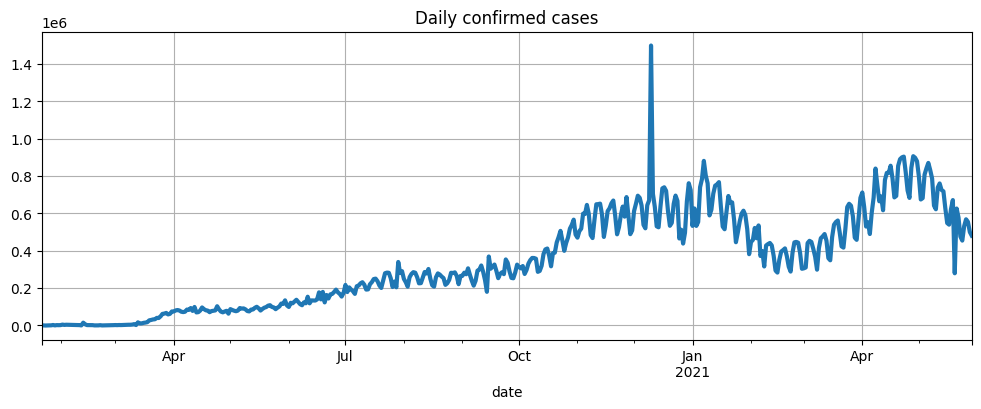

In [11]:
grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum()
grouped_cases.plot(
    kind='line',
    figsize=(12, 4),
    title='Daily confirmed cases',
    grid = True,
    lw = 3    
);

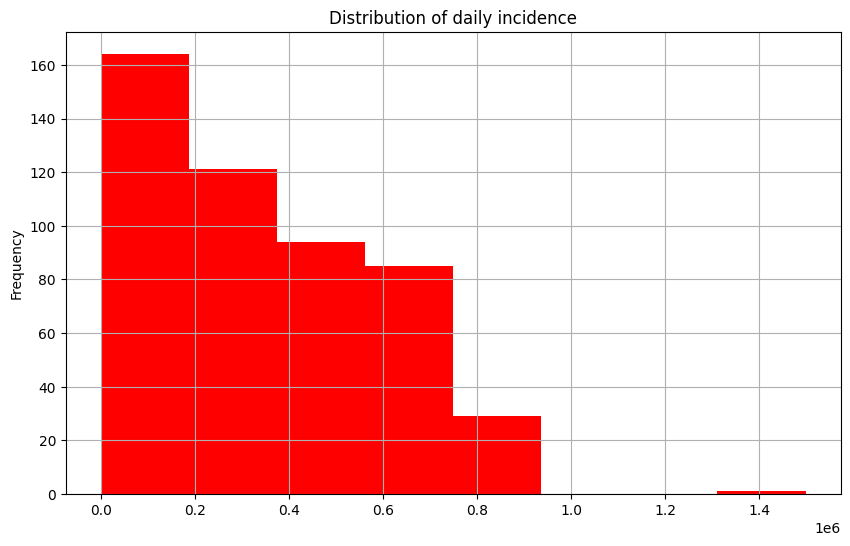

In [12]:
grouped_cases.plot(
    kind='hist',
    figsize=(10, 6),
    title='Distribution of daily incidence',
    grid = True,
    color = 'red',
    bins = 8
);

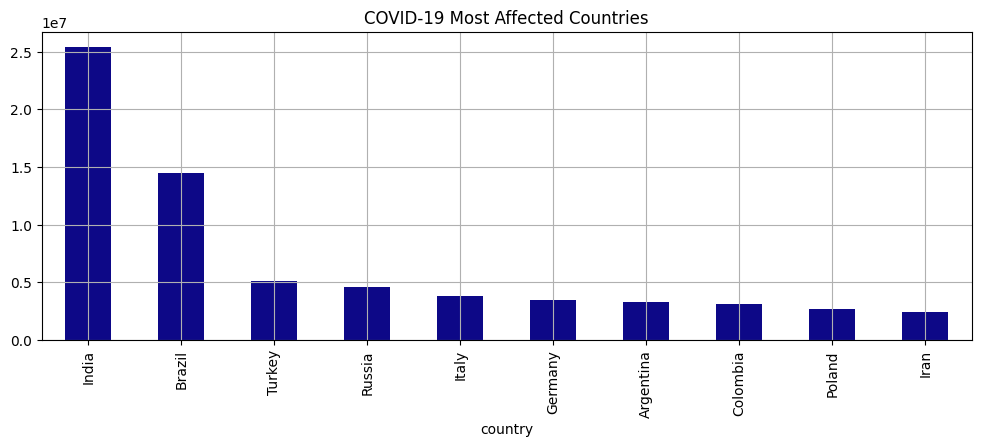

In [13]:
grouped_country = covid_df.groupby('country')['recovered'].last()
grouped_country = grouped_country.nlargest(10)
grouped_country.plot(
    kind='bar',
    grid = True,
    figsize = (12,4),
    colormap = 'plasma',
    title = 'COVID-19 Most Affected Countries'
);

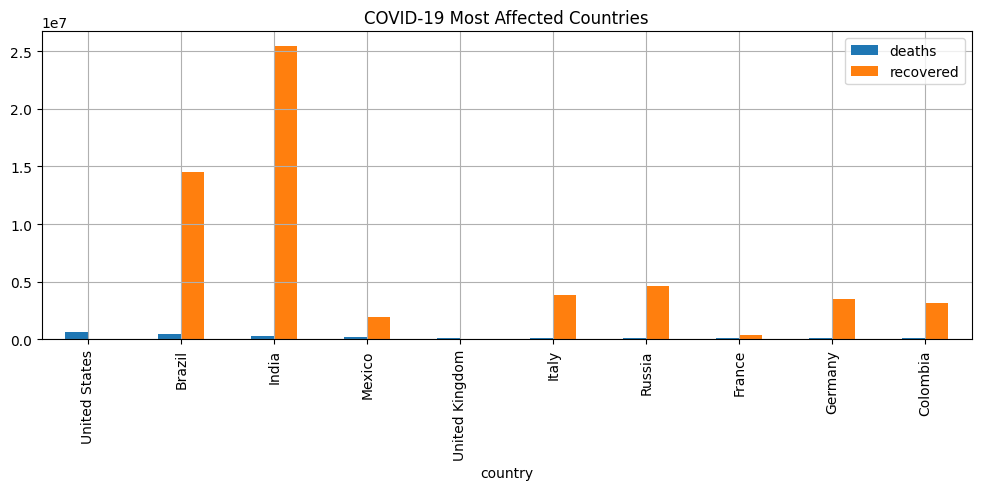

In [14]:
grouped_country = covid_df.groupby('country')[['deaths', 'recovered']].last()
grouped_country = grouped_country.nlargest(10, columns=['deaths'])
grouped_country.plot(
    kind='bar',
    grid = True,
    figsize = (12,4),
    title = 'COVID-19 Most Affected Countries'
);

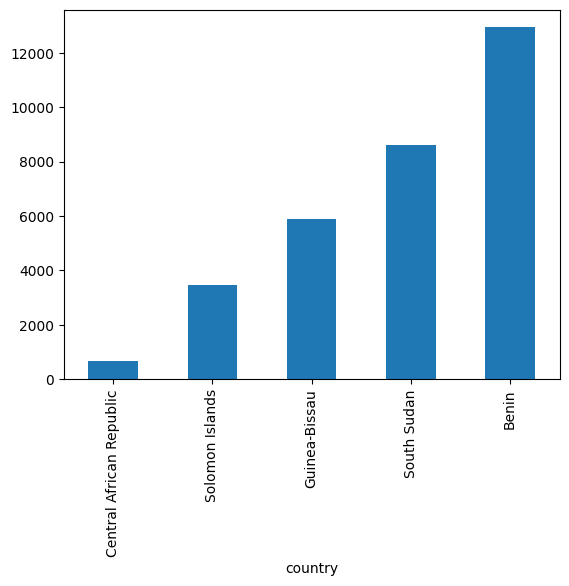

In [15]:

covid_df.groupby(['country'])['total_vaccinations'].last().nsmallest(5).plot(kind='bar');

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default')

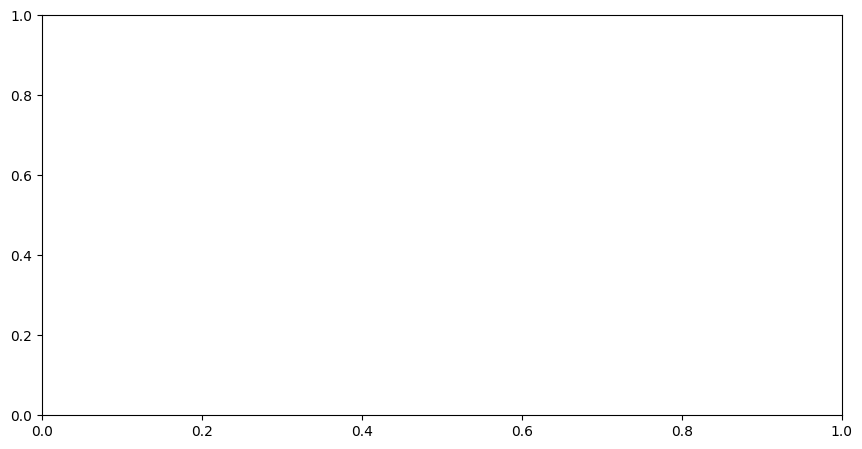

In [17]:
fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])

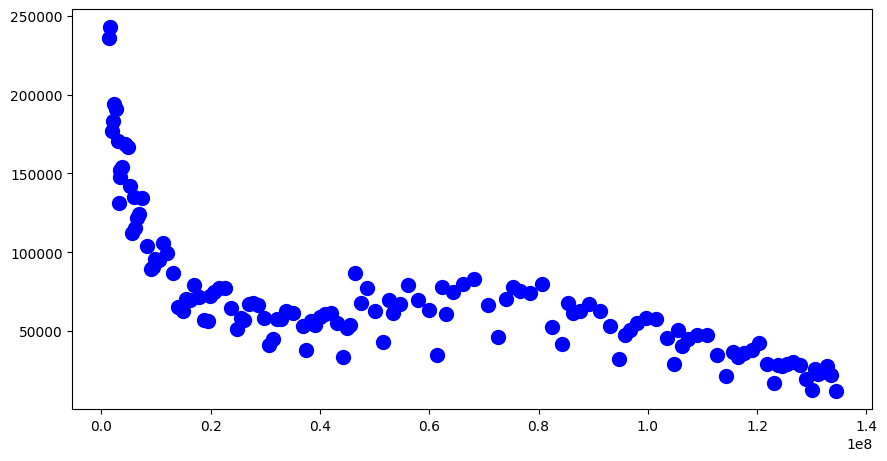

In [18]:
us_data = covid_df[covid_df['country'] == 'United States']
fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'],
    y=us_data['daily_confirmed'],
    s= 100,
    marker = 'o',
    c = 'blue'
);

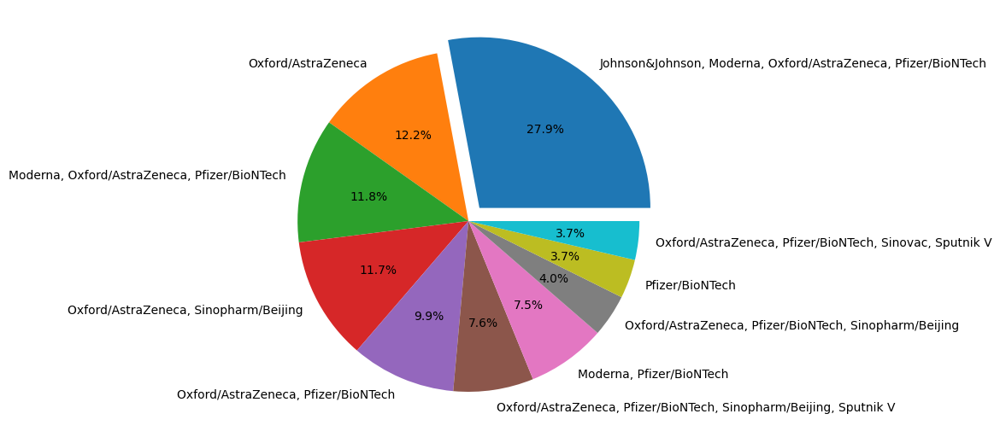

In [19]:
vaccine_combinations = covid_df['vaccines'].value_counts()[:10]
fig = plt.figure(figsize=(5,5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccine_combinations,
    labels = vaccine_combinations.index,
    autopct='%.1f%%',
    explode=[0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
);


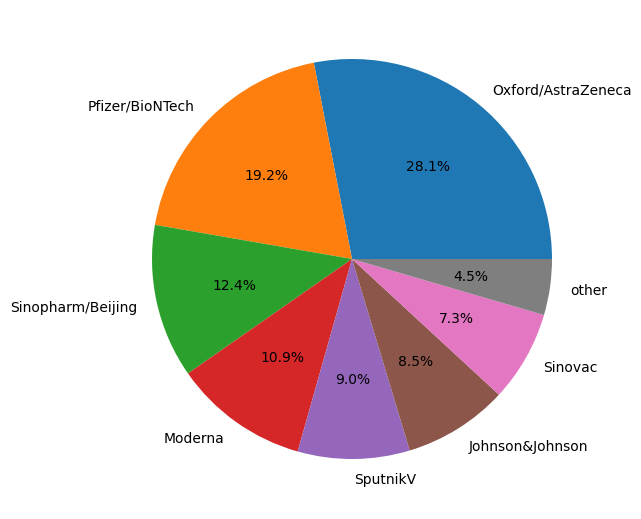

In [20]:
#избавляемся от пропусков в столбце с вакцинами
combination_not_nan = covid_df.dropna(subset=['vaccines'])
#группируем по странам и выбираем последнюю комбинацию вакцин в стране
combination_last = combination_not_nan.groupby(['country'])['vaccines'].last() 
#заменяем пробелы в строках и делим комбинации на отдельные вакцины по запятой
combination_last = combination_last.apply(lambda x: x.replace(' ', '').split(',')) 
#создаём пустой словарь, ключами которого будут вакцины, а значениями — количество стран
vaccines_dict = {} 
#создаём цикл по элементам Series combination_last
for vaccines_list in combination_last:
    #создаём цикл по элементам списка с вакцинами
    for vaccine in vaccines_list:
        #проверяем условие, что текущей вакцины ещё нет среди ключей словаря
        if vaccine not in vaccines_dict:#если условие выполняется
            vaccines_dict[vaccine] = 1 #заносим вакцину в словарь со значением 1
        else: #в противном случае
            vaccines_dict[vaccine] += 1 #увеличивает количество
#преобразуем словарь в Series
vaccines = pd.Series(vaccines_dict).sort_values(ascending=False)
#выделяем ТОП-7 вакцин и добавляем категорию 'other'
vaccines['other'] = vaccines[7:].sum()
vaccines = vaccines.sort_values(ascending=False)[:8]
#строим круговую диаграмму
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
);

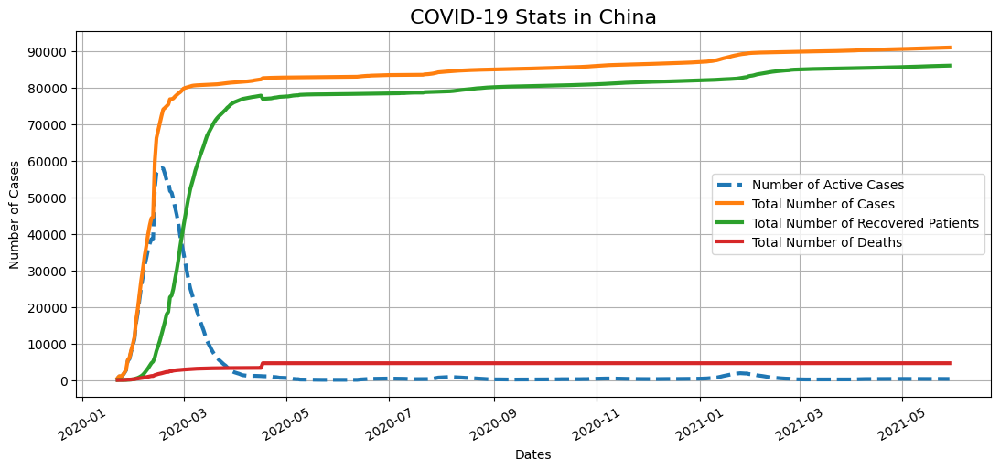

In [21]:
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed', 'active', 'deaths', 'recovered']].sum()
fig = plt.figure(figsize=(10, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.plot(china_grouped['active'], label = 'Number of Active Cases', lw=3, linestyle = 'dashed')
axes.plot(china_grouped['confirmed'], label = 'Total Number of Cases', lw=3)
axes.plot(china_grouped['recovered'], label = 'Total Number of Recovered Patients', lw=3)
axes.plot(china_grouped['deaths'], label = 'Total Number of Deaths', lw=3)
axes.set_title('COVID-19 Stats in China', fontsize = 16)
axes.set_xlabel('Dates')
axes.set_ylabel('Number of Cases')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

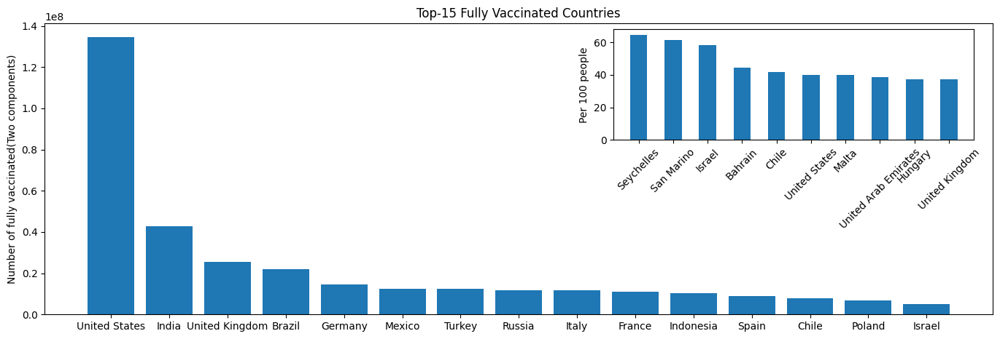

In [22]:
vacc_countries = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(15)
vacc_country_per_hundred = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(10)

fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(x = vacc_countries.index, height = vacc_countries)
main_axes.set_ylabel('Number of fully vaccinated(Two components)')
main_axes.set_title('Top-15 Fully Vaccinated Countries')

insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(x= vacc_country_per_hundred.index, height = vacc_country_per_hundred, width = 0.5)
insert_axes.set_ylabel('Per 100 people')
insert_axes.xaxis.set_tick_params(rotation=45)

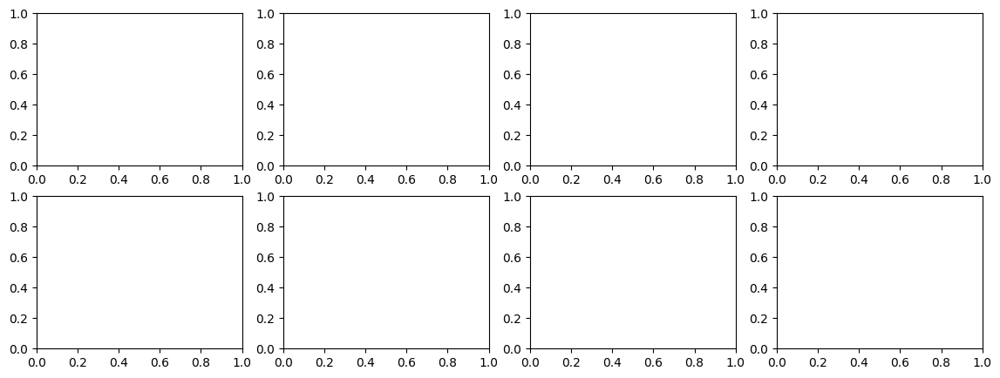

In [23]:
fig, axes = plt.subplots(nrows = 2, ncols = 4, figsize=(14,5))

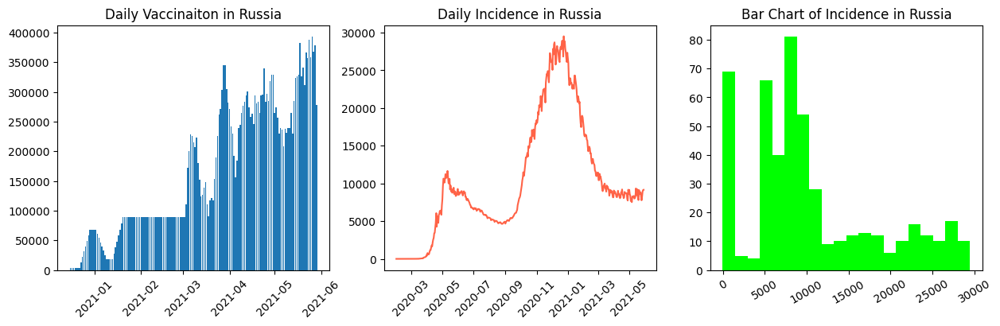

In [24]:
rus_data = covid_df[covid_df['country'] == 'Russia']
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 4))

axes[0].bar(
    x = rus_data['date'],
    height = rus_data['daily_vaccinations'],
    label = 'Number of Vaccinated',
)
axes[0].set_title('Daily Vaccinaiton in Russia')
axes[0].xaxis.set_tick_params(rotation=45)

axes[1].plot(
    rus_data['date'],
    rus_data['daily_confirmed'],
    label = 'Number of Confirmed Cases',
    color = 'tomato',
)
axes[1].set_title('Daily Incidence in Russia')
axes[1].xaxis.set_tick_params(rotation=45)

axes[2].hist(
    x = rus_data['daily_confirmed'],
    label = 'Number of Deceased',
    color = 'lime',
    bins = 20,
)
axes[2].set_title('Bar Chart of Incidence in Russia')
axes[2].xaxis.set_tick_params(rotation=30)

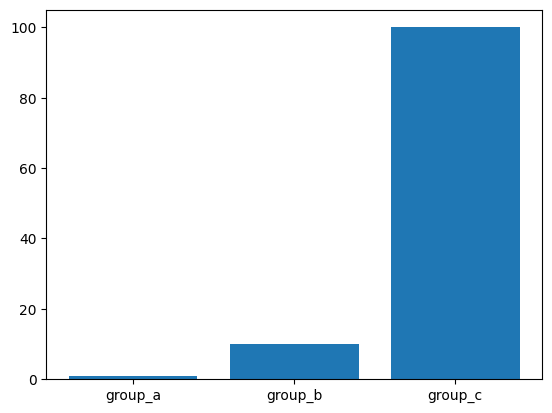

In [25]:
names = ['group_a', 'group_b', 'group_c']
values = [1, 10, 100]
plt.bar(names, values)
plt.show()

In [26]:
import seaborn as sns
print(sns.__version__)

0.12.0


In [27]:
countries = ['Russia', 'Canada', 'United Kingdom', 'Germany', 'Australia', 'United States']
cropped_covid_df = covid_df[covid_df['country'].isin(countries)]

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690],
    ['United States', 333449281]
    ],
    columns=['country', 'population']
)

cropped_covid_df = cropped_covid_df.merge(populations, on=['country'])
cropped_covid_df['daily_confirmed_per_hundred'] = cropped_covid_df['daily_confirmed'] / cropped_covid_df['population'] * 100
display(cropped_covid_df)

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate,population,daily_confirmed_per_hundred
0,2020-01-23,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25726900,NaN
1,2020-01-25,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,25726900,0.000016
2,2020-01-26,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,25726900,0.000000
3,2020-01-27,Australia,5.0,0.0,0.0,5.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,25726900,0.000004
4,2020-01-28,Australia,5.0,0.0,0.0,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,25726900,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2929,2021-05-25,United States,33166418.0,590941.0,0.0,32575477.0,22756.0,621.0,0.0,287788872.0,164378258.0,48.87,131078608.0,38.97,1750524.0,"Johnson&Johnson, Moderna, Pfizer/BioNTech",1.781745,0.0,333449281,0.006824
2930,2021-05-26,United States,33190470.0,591950.0,0.0,32598520.0,24052.0,1009.0,0.0,289212304.0,165074907.0,49.08,131850089.0,39.20,1703162.0,"Johnson&Johnson, Moderna, Pfizer/BioNTech",1.783494,0.0,333449281,0.007213
2931,2021-05-27,United States,33217995.0,593288.0,0.0,32624707.0,27525.0,1338.0,0.0,290724607.0,165718717.0,49.27,132769894.0,39.48,1618194.0,"Johnson&Johnson, Moderna, Pfizer/BioNTech",1.786044,0.0,333449281,0.008255
2932,2021-05-28,United States,33239963.0,593963.0,0.0,32646000.0,21968.0,675.0,0.0,292099778.0,166388129.0,49.47,133532544.0,39.70,1500632.0,"Johnson&Johnson, Moderna, Pfizer/BioNTech",1.786894,0.0,333449281,0.006588


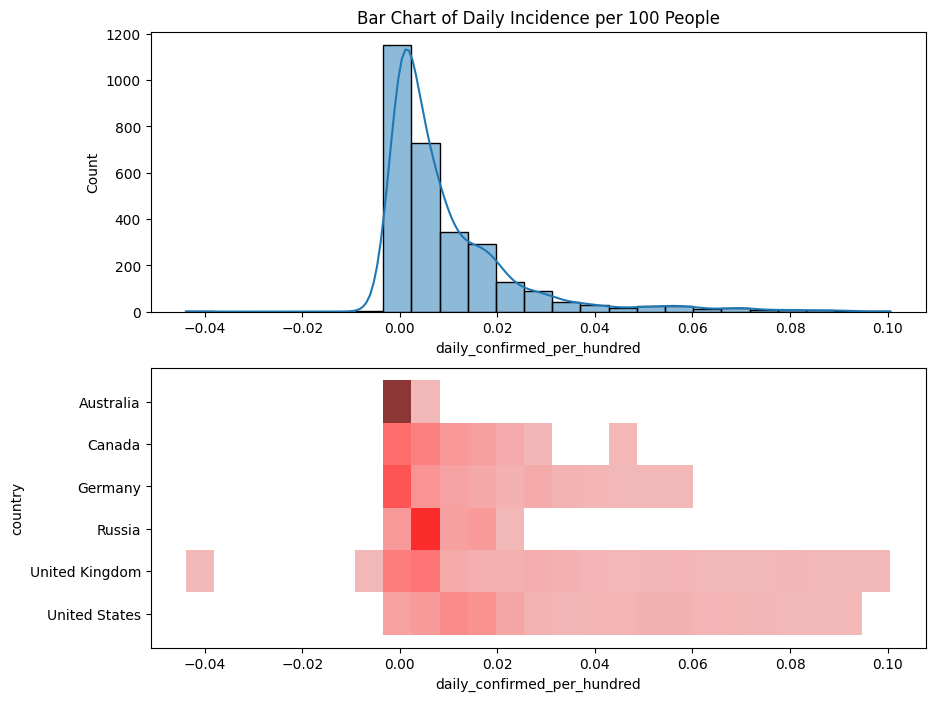

In [28]:
fig, axes = plt.subplots(nrows = 2, ncols = 1, figsize = (10, 8))
sns.histplot(
    data = cropped_covid_df,
    x = 'daily_confirmed_per_hundred',
    bins = 25,
    kde = True,
    ax = axes[0]    
);
axes[0].set_title('Bar Chart of Daily Incidence per 100 People')

sns.histplot(
    data = cropped_covid_df,
    x = 'daily_confirmed_per_hundred',
    y = 'country',
    bins  = 25,
    color = 'red',
    ax = axes[1]
);

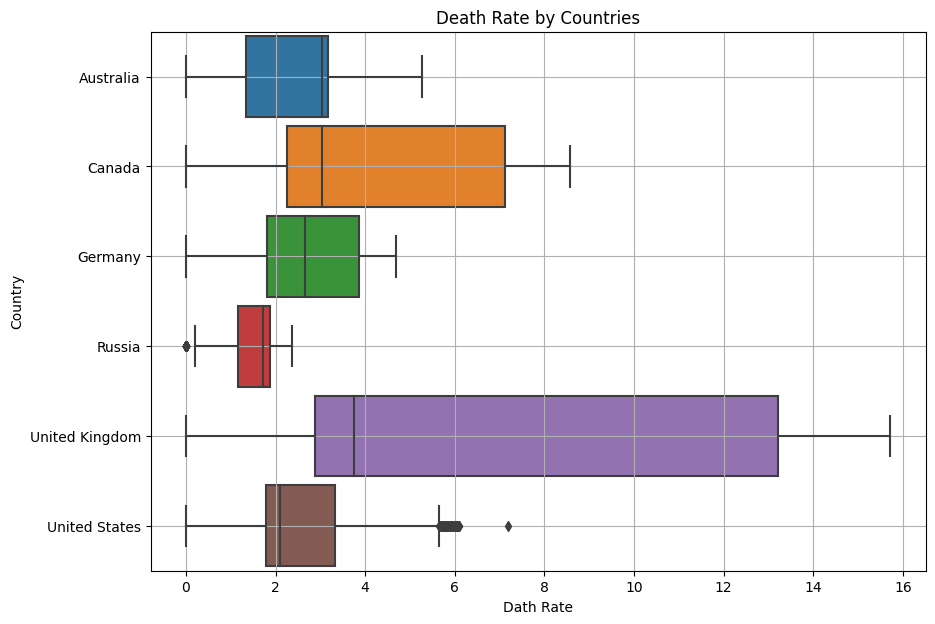

In [29]:
fig = plt.figure(figsize = (10, 7))
boxplot = sns.boxplot(
    data = cropped_covid_df,
    y = 'country',
    x = 'death_rate',
    orient = 'h',
    width = 0.9
)
boxplot.set_title('Death Rate by Countries')
boxplot.set_xlabel('Dath Rate')
boxplot.set_ylabel('Country')
boxplot.grid()

In [30]:
display(covid_df.groupby('country')['death_rate'].last().nlargest(20))

country
Vanuatu                   25.000000
MS Zaandam                22.222222
Yemen                     19.595900
Mexico                     9.266213
Sudan                      7.367735
Syria                      7.213584
Egypt                      5.755029
Somalia                    5.241248
China                      5.090478
Ecuador                    4.822939
Bosnia and Herzegovina     4.518762
Bulgaria                   4.221931
Afghanistan                4.134872
Tanzania                   4.125737
Zimbabwe                   4.094213
Liberia                    3.946765
Bolivia                    3.936310
Comoros                    3.761917
Hungary                    3.695002
Tunisia                    3.661896
Name: death_rate, dtype: float64

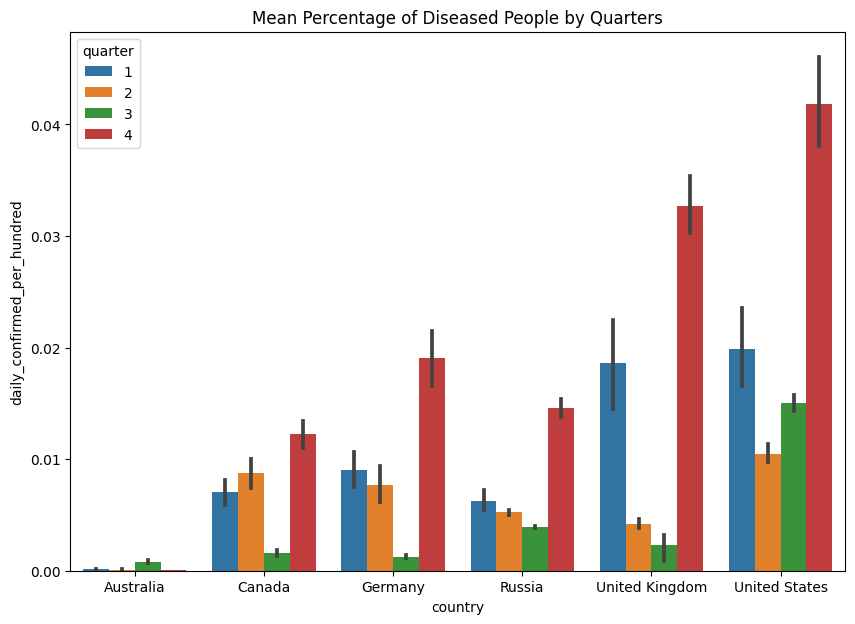

In [31]:
fig = plt.figure(figsize=(10, 7))
cropped_covid_df['quarter'] = cropped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=cropped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
)
barplot.set_title('Mean Percentage of Diseased People by Quarters');

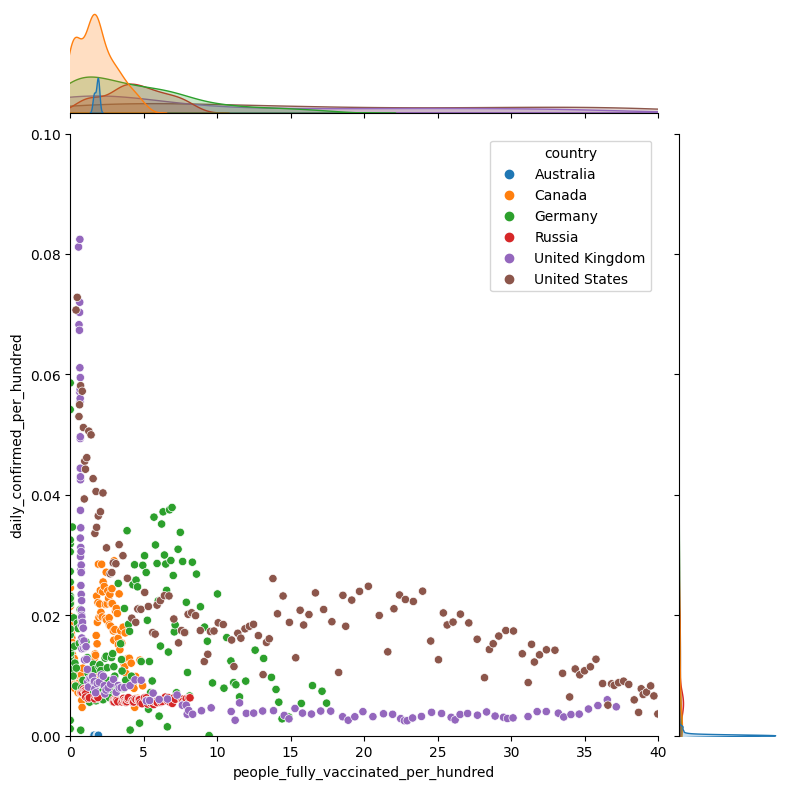

In [32]:
jointplot = sns.jointplot(
    data=cropped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
)

In [33]:
pivot = cropped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
pivot.columns = pivot.columns.astype('string')
display(pivot)

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56
United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.17,0.18,NaN,...,47.63,47.95,48.31,48.56,48.73,48.87,49.08,49.27,49.47,49.70


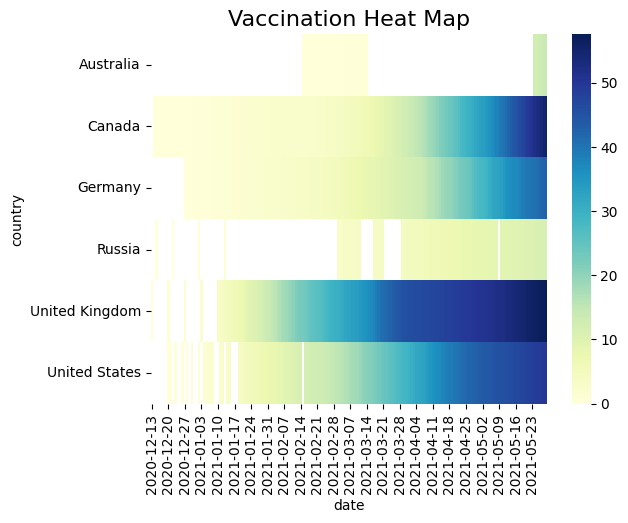

In [34]:
heatmap = sns.heatmap(
    data=pivot, 
    cmap='YlGnBu'
)
heatmap.set_title('Vaccination Heat Map', fontsize=16);

Text(0.5, 1.0, 'Incidence Heat Map')

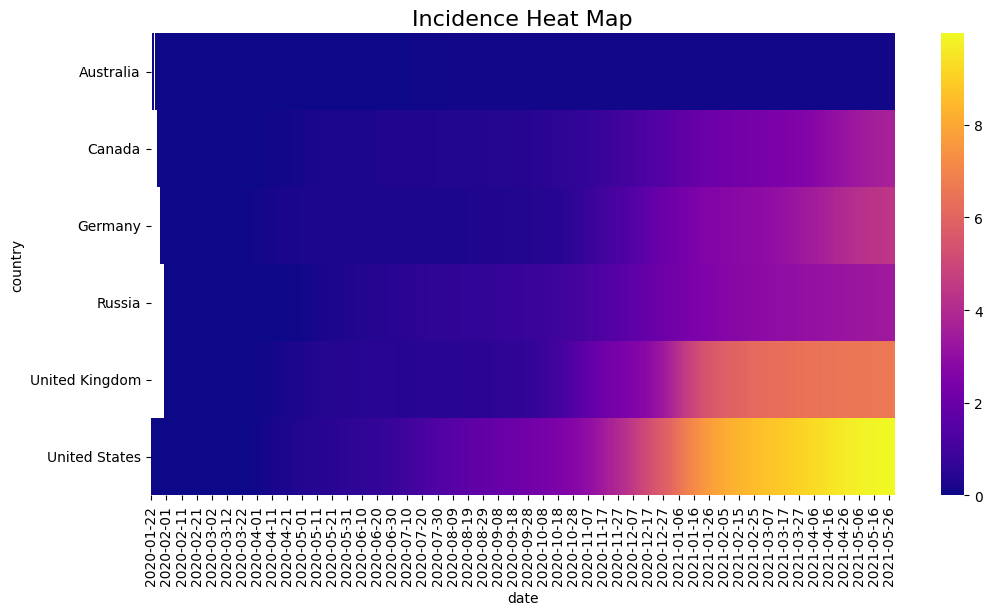

In [35]:
cropped_covid_df['confirmed_per_hundred'] = cropped_covid_df['confirmed'] / cropped_covid_df['population'] * 100
pivot = cropped_covid_df.pivot_table(
    values='confirmed_per_hundred',
    columns='date',
    index='country'
)
pivot.columns = pivot.columns.astype('string')
fig = plt.figure(figsize=(12,6))
heatmap = sns.heatmap(data = pivot, cmap = 'plasma')
heatmap.set_title('Incidence Heat Map', fontsize = 16)

Text(0.5, 1.0, 'Recovery Rate by Countries')

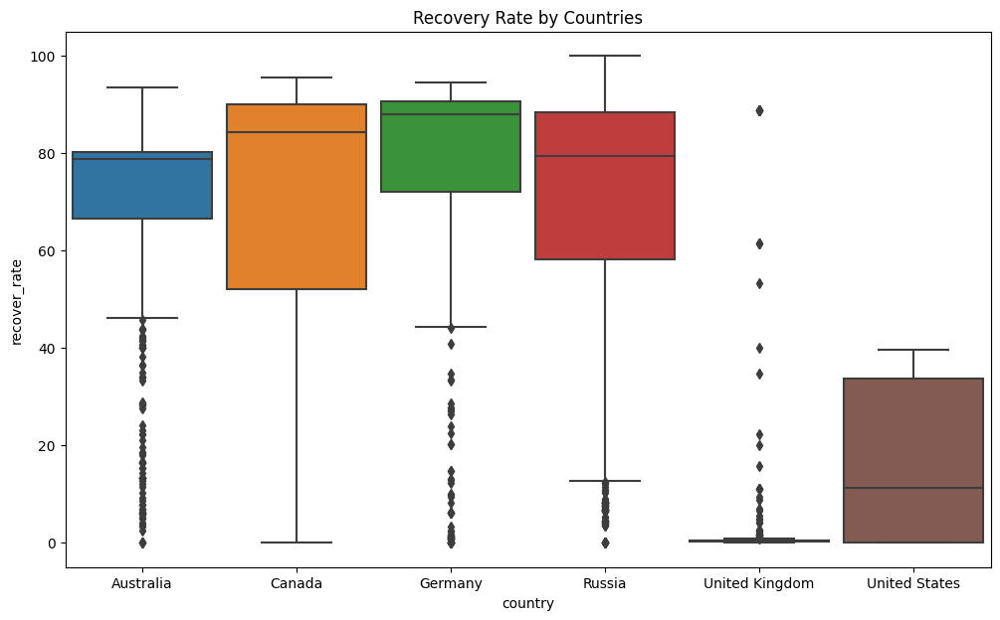

In [36]:
fig = plt.figure(figsize = (12, 7))
boxplot = sns.boxplot(
    data = cropped_covid_df,
    x = 'country',
    y = 'recover_rate',
    orient = 'v',
    width = 0.9
)
boxplot.set_title('Recovery Rate by Countries')

In [37]:
import plotly
import plotly.express as px
print(plotly.__version__)

5.10.0


In [38]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

In [43]:
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recover_rate']].mean().round(2).nlargest(15, columns=['recover_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recover_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recover_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1200, #ширина
    title='Top 15 Countries for Recovery Rate' #заголовок
)

#отображаем его
fig.show()

In [44]:
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем график
fig.show()

In [45]:
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

In [46]:
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #DataFrame
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()
fig.write_html("plotly/scatter_3d.html")

FileNotFoundError: [Errno 2] No such file or directory: 'plotly\\scatter_3d.html'

In [47]:
line_data = covid_df.groupby('date', as_index=False)['daily_vaccinations'].sum()
fig = px.line(
    data_frame=line_data,
    x = 'date',
    y = 'daily_vaccinations'
)
fig.show()

In [48]:
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="total_vaccinations", #от чего зависит цвет
    hover_name="country", #группирующая переменная
    animation_frame="date", #анимационный бегунок
    color_continuous_scale='Reds', #палитра цветов
    range_color=[0, 600e6] #диапазон цвета
)

fig.show()